In [1]:
#Importing Libraries
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [2]:
#Setting Directories
base_path = "dataset"

img_face = os.path.join(base_path, "Pratheepan_Dataset", "FacePhoto")
img_family = os.path.join(base_path, "Pratheepan_Dataset", "FamilyPhoto")

mask_face = os.path.join(base_path, "Ground_Truth", "GroundT_FacePhoto")
mask_family = os.path.join(base_path, "Ground_Truth", "GroundT_FamilyPhoto")

In [3]:
#Loading Dataset
images = []
masks = []

def load_data(img_dir, mask_dir):
    img_files = os.listdir(img_dir)
    mask_files = os.listdir(mask_dir)
    # print(img_files)
    # print(mask_files)

    # Create dict for masks (name → file)
    mask_dict = {
        os.path.splitext(f)[0]: f for f in mask_files
    }

    count = 0

    for img_file in img_files:
        img_name = os.path.splitext(img_file)[0]

        if img_name in mask_dict:
            img_path = os.path.join(img_dir, img_file)
            mask_path = os.path.join(mask_dir, mask_dict[img_name])

            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            if img is not None and mask is not None:
                images.append(img)
                masks.append(mask)
                count += 1

    print(f"Loaded from {img_dir}: {count}")

# Load both datasets
load_data(img_face, mask_face)
load_data(img_family, mask_family)

print("Total images loaded:", len(images))

Loaded from dataset\Pratheepan_Dataset\FacePhoto: 32
Loaded from dataset\Pratheepan_Dataset\FamilyPhoto: 46
Total images loaded: 78


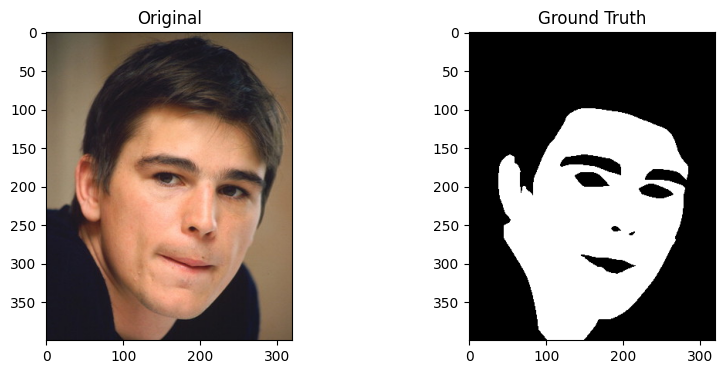

In [4]:
#Show Sample
idx = 11
# idx = 5

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(cv2.cvtColor(images[idx], cv2.COLOR_BGR2RGB))

plt.subplot(1,2,2)
plt.title("Ground Truth")
plt.imshow(masks[idx], cmap='gray')

plt.show()

In [5]:
# Preprocessing
#Pipeline: Image → Resize → Denoise → Enhance → Output (clean image)
def preprocess(img):
    img = cv2.resize(src=img, dsize=(224, 224))
    
    # img = cv2.GaussianBlur(src=img, ksize=(5, 5), sigmaX=0)
    img = cv2.GaussianBlur(img, (3,3), 0)
    
    # CLAHE (Contrast Limited Adaptive Histogram Equalization) 
    lab = cv2.cvtColor(src=img, code=cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(m=lab)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(src=l)

    enhanced = cv2.merge(mv=(l, a, b))
    img = cv2.cvtColor(src=enhanced, code=cv2.COLOR_LAB2BGR)

    return img

In [6]:
#HSV + YCbCr Detection
def detect_skin(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    ycbcr = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    
    # HSV threshold
    lower_hsv = np.array([0, 30, 60])
    upper_hsv = np.array([20, 150, 255])
    mask_hsv = cv2.inRange(hsv, lower_hsv, upper_hsv)

    # YCbCr threshold
    lower_ycbcr = np.array([0, 135, 85])
    upper_ycbcr = np.array([255, 180, 135])
    mask_ycbcr = cv2.inRange(ycbcr, lower_ycbcr, upper_ycbcr)

    # Combine
    mask = cv2.bitwise_and(mask_hsv, mask_ycbcr)

    return mask

In [7]:
#Post Processing
def clean_mask(mask):
    kernel = np.ones((3,3), np.uint8)

    mask = cv2.medianBlur(mask, 5)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask

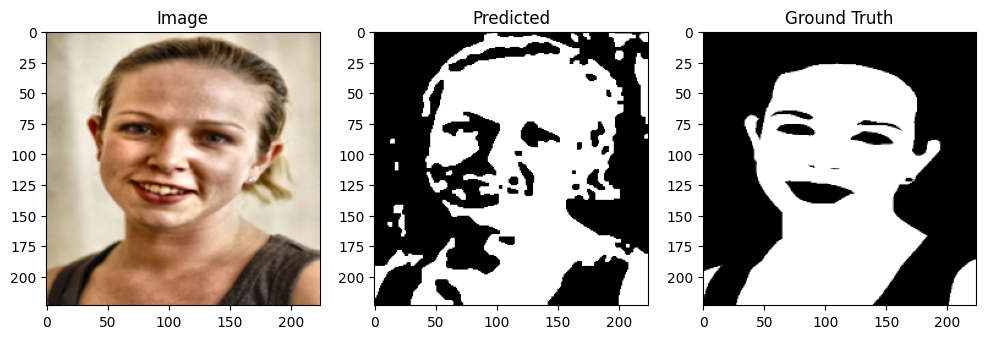

In [8]:
#Testing One Image
img = preprocess(images[1])
pred = detect_skin(img)
pred = clean_mask(pred)

gt = cv2.resize(masks[1], (224,224))

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.title("Image")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1,3,2)
plt.title("Predicted")
plt.imshow(pred, cmap='gray')

plt.subplot(1,3,3)
plt.title("Ground Truth")
plt.imshow(gt, cmap='gray')

plt.show()

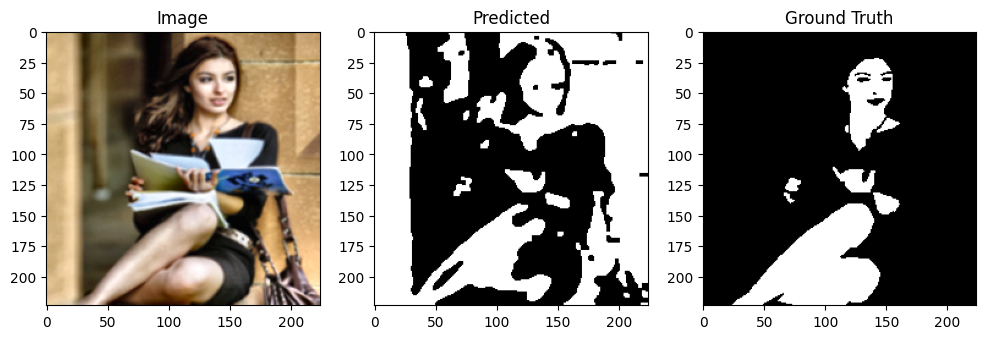

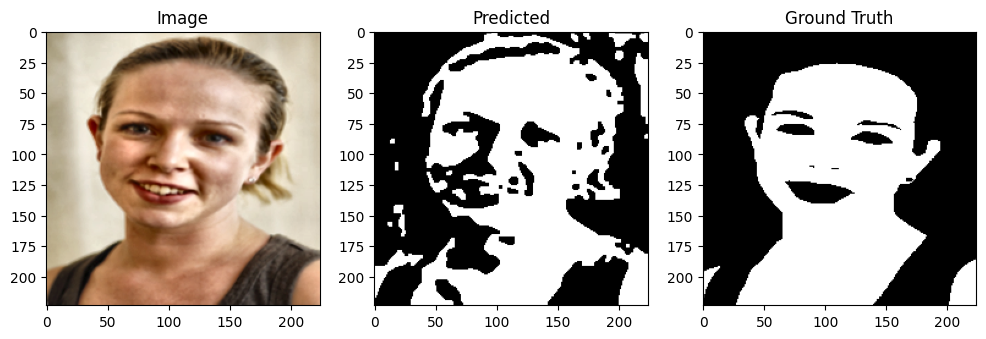

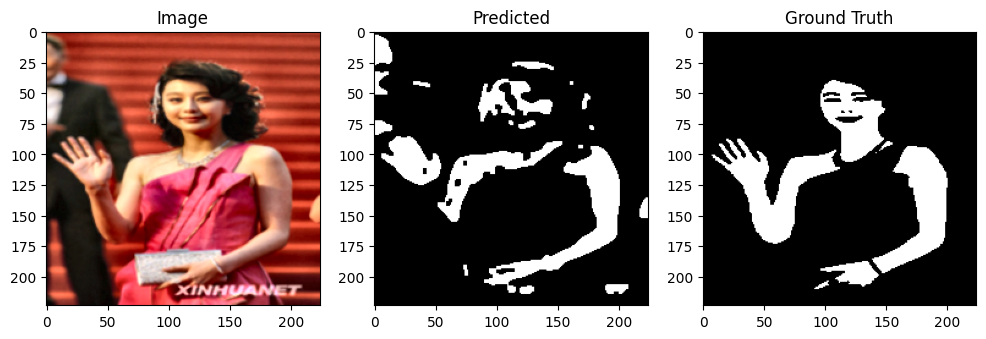

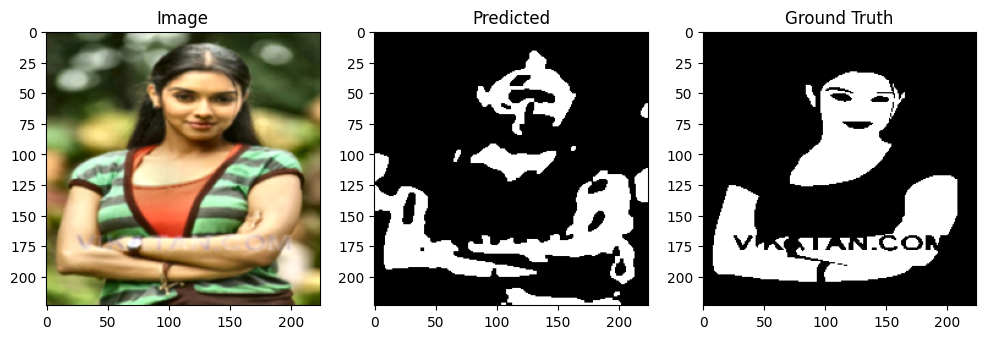

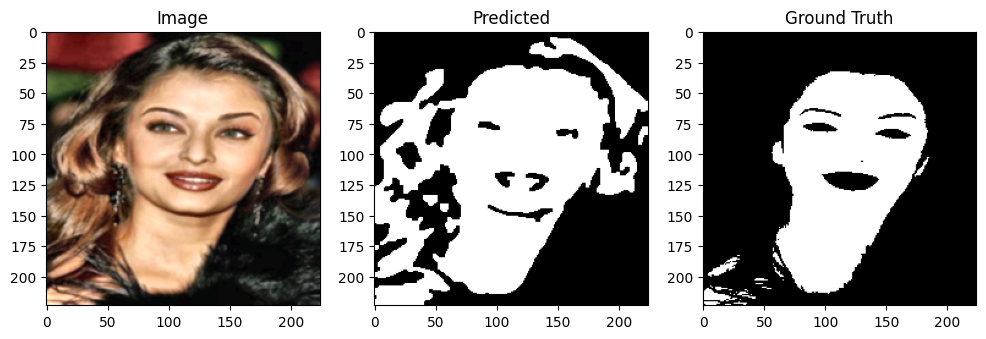

...

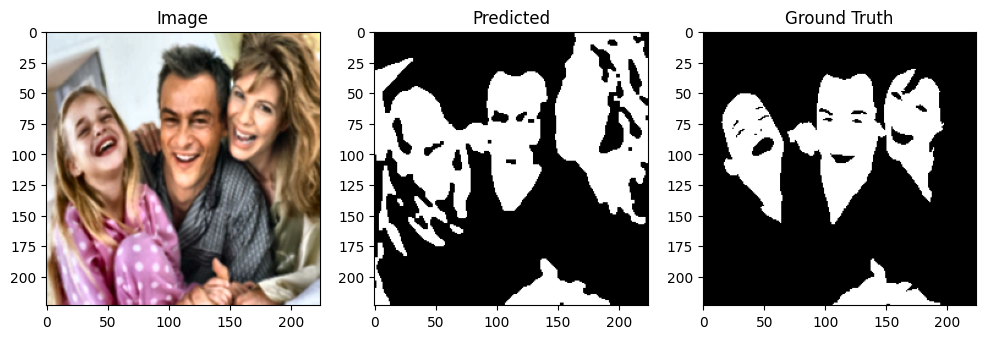

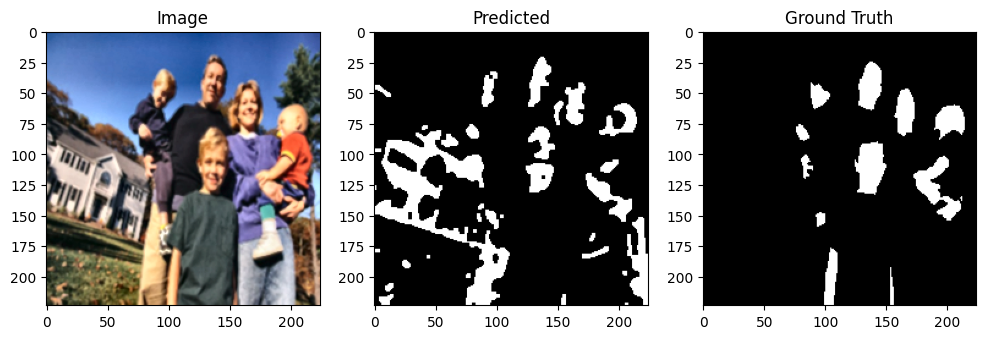

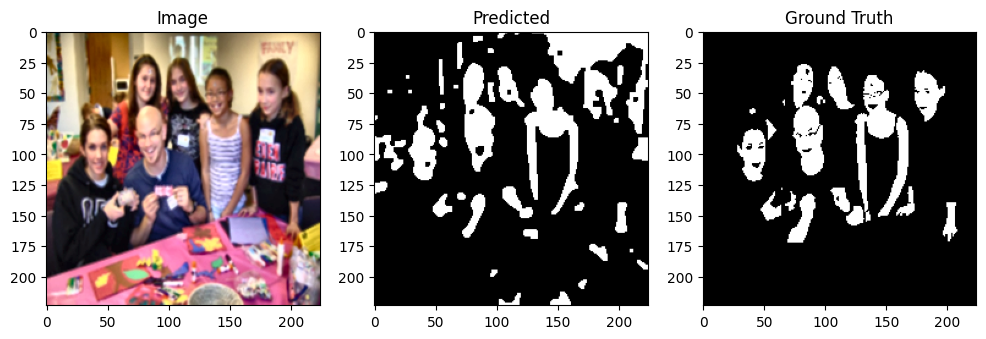

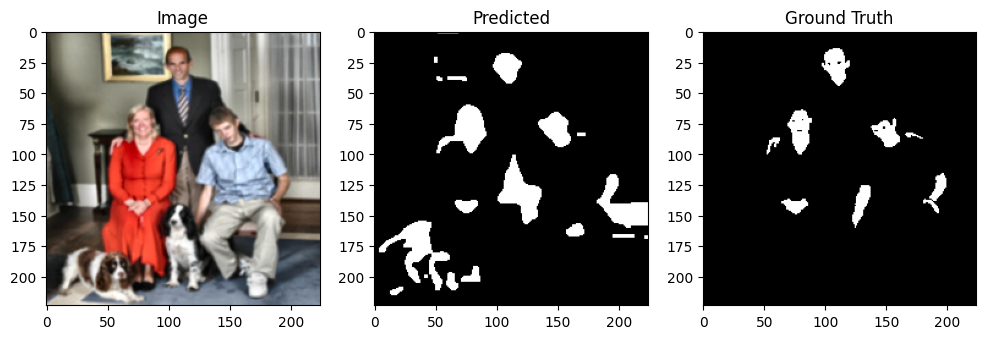

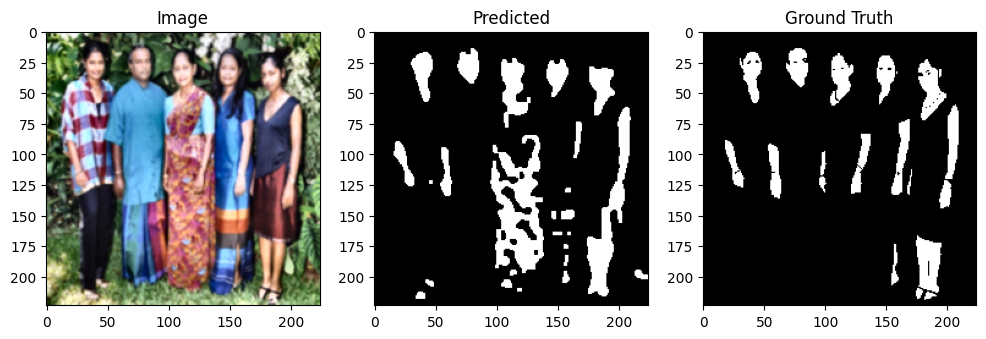

In [9]:
#Testing for 5 Images
for i in range(50):
    img = preprocess(images[i])
    pred = detect_skin(img)
    pred = clean_mask(pred)
    
    gt = cv2.resize(masks[i], (224,224))
    gt = (gt > 127).astype(np.uint8) * 255
    
    plt.figure(figsize=(12,4))
    
    plt.subplot(1,3,1)
    plt.title("Image")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    plt.subplot(1,3,2)
    plt.title("Predicted")
    plt.imshow(pred, cmap='gray')
    
    plt.subplot(1,3,3)
    plt.title("Ground Truth")
    plt.imshow(gt, cmap='gray')
    
    plt.show()

In [10]:
#Evaluation Function
def evaluate(pred, gt):
    pred = pred.flatten() // 255
    gt = gt.flatten() // 255

    acc = accuracy_score(gt, pred)
    return acc

In [11]:
# Performance Metrics

def calculate_metrics(pred, gt):
    # Convert to binary (0 or 1)
    pred = pred // 255
    gt = gt // 255

    pred = pred.flatten()
    gt = gt.flatten()

    # True positives, false positives, etc.
    tp = np.sum((pred == 1) & (gt == 1))
    tn = np.sum((pred == 0) & (gt == 0))
    fp = np.sum((pred == 1) & (gt == 0))
    fn = np.sum((pred == 0) & (gt == 1))

    # Accuracy
    accuracy = (tp + tn) / (tp + tn + fp + fn)

    # IoU
    union = tp + fp + fn
    iou = tp / union if union != 0 else 0

    # Dice Coefficient
    dice = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) != 0 else 0

    return accuracy, iou, dice

In [12]:
accuracies = []
ious = []
dices = []

for i in range(len(images)):
    img = preprocess(images[i])
    pred = detect_skin(img)
    pred = clean_mask(pred)

    gt = cv2.resize(masks[i], (224,224))

    acc, iou, dice = calculate_metrics(pred, gt)

    accuracies.append(acc)
    ious.append(iou)
    dices.append(dice)

print("========== PERFORMANCE ==========")
print("Average Accuracy:", np.mean(accuracies))
print("Average IoU:", np.mean(ious))
print("Average Dice:", np.mean(dices))

========== PERFORMANCE ==========
Average Accuracy: 0.7900209212290685
Average IoU: 0.43141572779405424
Average Dice: 0.5673608525356798


In [13]:
all_pred = []
all_gt = []

for i in range(len(images)):
    img = preprocess(images[i])
    pred = detect_skin(img)
    pred = clean_mask(pred)

    gt = cv2.resize(masks[i], (224,224))

    all_pred.extend(pred.flatten() // 255)
    all_gt.extend(gt.flatten() // 255)

print("Confusion Matrix:\n", confusion_matrix(all_gt, all_pred))
print("\nClassification Report:\n", classification_report(all_gt, all_pred))

Confusion Matrix:
 [[2533522  688174]
 [ 133627  558405]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.79      0.86   3221696
           1       0.45      0.81      0.58    692032

    accuracy                           0.79   3913728
   macro avg       0.70      0.80      0.72   3913728
weighted avg       0.86      0.79      0.81   3913728



In [ ]:
import cv2
import numpy as np

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: Cannot access webcam")
    exit()

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Preprocess
    img = preprocess(frame)

    # Detect skin
    mask = detect_skin(img)
    mask = clean_mask(mask)

    # Show results
    cv2.imshow("Original", frame)
    cv2.imshow("Skin Mask", mask)

    # Exit on ESC key
    if cv2.waitKey(1) & 0xFF == 27:
        break

cap.release()
cv2.destroyAllWindows()